<h1> MASTER'S THESIS PROJECT </h1>
PART 2

---




<h2> Deep Learning based 
Image Segmentation for Autonomous Vehicles using U-NET </h2>

---
<b>
<br>

**Description**: This notebook contains the implementation of a deep learning based binary image segmentation model.

**Dataset used**: Cityscapes dataset

@author : Shweta Varadarajan<br>
Student-ID : 100963763



In [ ]:
#Relevant imports needed for the project
import os
from PIL import Image 
import torch
from torch.utils.data import Dataset
from torchvision import transforms, datasets
import torch.nn as nn
import torchvision.transforms.functional as TF
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, utils, transforms
from torchvision.datasets import Cityscapes
from PIL import Image
from tqdm import tqdm
import numpy as np
import sys
sys.path.insert(0,'/content/drive/MyDrive/Data/cityscapes/cityscapes/cityscapesScripts/cityscapesscripts/helpers')
from labels import trainId2label as t2l
import matplotlib.pyplot as plt
from torchvision import transforms
from collections import defaultdict

DATASET DEFINITION
PyTorch library allows creation of custom dataset by overriding the 'getitem' and 'len' funtions. <br>
Reference: https://pytorch.org/tutorials/beginner/basics/data_tutorial.html

In [ ]:
class CityscapesDataset(Dataset):
    def __init__(self, split, target_type='semantic', mode='fine', transform=None, eval=False,training_type='TrainIds'):
        self.transform = transform
        self.mode = 'gtFine'       
        self.split = split
        self.mask_list = []
        self.originalImg_list = []
        #model.eval mode status
        self.eval = eval     

        #Defining path for the labels
        self.mask_path = os.path.join('/content/drive/MyDrive/Data/cityscapes'+'/'+self.mode+'/'+self.split)
        #Original images folder path
        self.originalImg_path = os.path.join('/content/drive/MyDrive/Data/cityscapes/'+'/leftImg8bit/'+self.split)
        city_list = os.listdir(self.mask_path)
        for city in city_list:
            temp = os.listdir(self.mask_path+'/'+city)
            list_items = temp.copy()
    
            # Filter images according to training type i.e 19 classes or 33 classes

            if training_type == 'TrainIds':
              train_on_img = 'labelTrainIds.png'
            elif training_type == 'LabelIds':
              train_on_img = 'labelIds.png'

              #remove all the unwanted images from the folder
            for item in temp:
                if not item.endswith(train_on_img, 0, len(item)):
                    list_items.remove(item)

            # defining paths for the masks
            list_items = ['/'+city+'/'+path for path in list_items]      
            #adding the masks to the list
            self.mask_list.extend(list_items)

            #Finding the corresponding original image
            self.originalImg_list.extend(
                ['/'+city+'/'+path for path in os.listdir(self.originalImg_path+'/'+city)]
            )         
                
    def __len__(self):
        return len(self.originalImg_list)
      

    def __getitem__(self, index):
        #The list created in the init function is shuffled therefore sorted function is used so that the mask and the original 
        #image are correctly mapped
        self.originalImg_list = sorted(self.originalImg_list)
        self.mask_list = sorted(self.mask_list)
        #open image in PIL format
        image = Image.open(self.originalImg_path+self.originalImg_list[index])
        y = Image.open(self.mask_path+self.mask_list[index])        
        #Apply transformation to the images
        if self.transform is not None:
            image = self.transform(image)
            y = self.transform(y)

        #Converting images and label to tensor for metric calculation
        image = transforms.ToTensor()(image)
        y = np.array(y)
        y = torch.from_numpy(y).type(torch.LongTensor)
        if self.eval:
            return image, y, self.originalImg_list[index]
        else:
            return image, y

<h3>UNET MODEL DEFINITION </h3>

Refereces : 
1.  O. Ronneberger, P. Fischer, and T. Brox, ‘U-Net: Convolutional Networks for Biomedical Image Segmentation’. arXiv, May 18, 2015. Accessed: Jul. 29, 2022. [Online]. Available: http://arxiv.org/abs/1505.04597

2.  UNET Architecture reference: ‘Machine-Learning-Collection/ML/Pytorch/image_segmentation/semantic_segmentation_unet at master · aladdinpersson/Machine-Learning-Collection’. https://github.com/aladdinpersson/Machine-Learning-Collection/tree/master/ML/Pytorch/image_segmentation/semantic_segmentation_unet


In [ ]:
class DoubleConv(nn.Module):
  """ 
  This class is used to define the double convolution Kernels on each level of the UNET Architecture on both the contractive and expansive paths. Each
  kernel of convolution is followed by normalization and ELU activation function
  The ReLU is replaced by an ELU and batchnorm has been added which is different from the original UNET architecture.
  This class is later instantiated in the UNET model definition in the later sectins of the code
  """

  def __init__(self, in_channels, out_channels):
    """
    This funtion is called during the object creation of the class. The sequential model is defined here.
    
      Parameters
      ----------
      predictions : in_channels
      target :Out_channels       

      Returns
      -------
      accuracy value
    """
    super(DoubleConv,self).__init__()

    self.conv = nn.Sequential(
        nn.Conv2d(in_channels, out_channels,kernel_size=3,stride=1,padding=1, dilation=1,bias=False),
        nn.BatchNorm2d(out_channels),
        nn.ELU(inplace=True), #inplace true replaces the values in the same kernel
        nn.Conv2d(out_channels, out_channels,kernel_size=3,stride=1,padding=1, dilation=1,bias=False),
        nn.BatchNorm2d(out_channels),
        nn.ELU(inplace=True),
    )

  def forward(self, x):
    return self.conv(x) # Returns the sequential execution of the above block of code on function call

class DoubleDilatedConv(nn.Module):
  """ 
  This class is used to define the double convolution Kernels on each level of the UNET Architecture on both the contractive and expansive paths. Each
  kernel of convolution is followed by normalization and ELU activation function
  The ReLU is replaced by an ELU and batchnorm has been added which is different from the original UNET architecture.
  The dilation rate and padding are modified
  """
  def __init__(self, in_channels, out_channels):
    super(DoubleConv,self).__init__()

    self.conv = nn.Sequential(
        nn.Conv2d(in_channels, out_channels,kernel_size=3,stride=1,padding=2, dilation=2,bias=False),
        nn.BatchNorm2d(out_channels),        
        nn.ELU(inplace=True),
        nn.Conv2d(out_channels, out_channels,kernel_size=3,stride=1,padding=4, dilation=4,bias=False),
        nn.BatchNorm2d(out_channels),
        nn.ELU(inplace=True),
    )

  def forward(self, x):
    return self.conv(x)


class DeepDilatedConv(nn.Module):
  """
  This class implements the ASPP(Atrous Spatial Pyramid pooling) which is combined with the UNET in the bottle neck part 
  of the architecture. The ASPP is a compbination of 4 layers of sequential model with differnt dilation rates and biases
  This part of the architecture modification is introduced from DeepLab architecture. These sequential blocks are procesed 
  parallely and then concatenated and then passed through a 1x1 convolution
  """
  def __init__(self, in_channels, out_channels):
    super(DeepDilatedConv,self).__init__()

    self.atrousblock1 =  nn.Sequential(
        nn.Conv2d(in_channels, out_channels,kernel_size=3,stride=1,padding=1, dilation=1,bias=False),
        nn.BatchNorm2d(out_channels),
        nn.ELU(inplace=True),)
   
    self.atrousblock2 =  nn.Sequential(
        nn.Conv2d(in_channels, out_channels,kernel_size=3,stride=1,padding=6, dilation=6,bias=False),
        nn.BatchNorm2d(out_channels),
        nn.ELU(inplace=True),)
    
    self.atrousblock3 =  nn.Sequential(
        nn.Conv2d(in_channels, out_channels,kernel_size=3,stride=1,padding=12, dilation=12,bias=False),
        nn.BatchNorm2d(out_channels),
        nn.ELU(inplace=True),)
     
    self.atrousblock4 =  nn.Sequential(
        nn.Conv2d(in_channels, out_channels,kernel_size=3,stride=1,padding=18, dilation=18,bias=False),
        nn.BatchNorm2d(out_channels),
        nn.ELU(inplace=True),)
    
    self.onecrossone = nn.Conv2d(out_channels*4, out_channels, kernel_size=1)

  def forward(self, x):
    self.atrouslayer1=  self.atrousblock1(x) #parallel layer 1
    self.atrouslayer2=  self.atrousblock2(x) #parallel layer 2
    self.atrouslayer3=  self.atrousblock3(x) #parallel layer 3
    self.atrouslayer4=  self.atrousblock4(x) #parallel layer 4
    out = self.onecrossone(torch.cat([self.atrouslayer1,self.atrouslayer2,self.atrouslayer3,self.atrouslayer4],dim=1)) #1X1 convolution layer
    return out

In [ ]:
class UNET(nn.Module):
  """
  UNET architecture as defined in the original paper with ELU and batch normalisation  
  """
  def __init__(
      self, in_channels, out_channels=1, features=[64,128,256,512],dilated= False
  ):
    super(UNET, self).__init__()
    self.contractive = nn.ModuleList() #Modulelist to save values of downsampling
    self.expansive = nn.ModuleList() #Modulelist to save values of upsampling
    self.pool = nn.MaxPool2d(kernel_size=2, stride=2) #Max pooling layer to downsample

    #Down part
    for feature in features:#values starting from 64 to 1024
      self.contractive.append(DoubleConv(in_channels, feature)) 
      in_channels = feature

    #Up part
    for feature in reversed(features): #values starting from 1024 to 64
      self.expansive.append(nn.ConvTranspose2d(feature*2, feature, kernel_size=2,stride=2, dilation=1))# Transpose Convolution for upsampling 
      self.expansive.append(DoubleConv(feature*2,feature))#Normal convolution after upsampling
    if dilated == True: #For ASPP model
      self.bottomlayer = DeepDilatedConv(features[-1], features[-1]*2)
    else:# without ASPP model
      self.bottomlayer = DoubleConv(features[-1], features[-1]*2)
    self.finaloutconv = nn.Conv2d(features[0], out_channels,kernel_size=1,dilation=1)


  def forward(self, x):
    skip_connections = []

    for down in self.contractive: #Downsampling
      x = down(x)      
      skip_connections.append(x) #Saving values to concatenate later to the upsampling part
      x = self.pool(x)#Max pool to downsample
    
    x = self.bottomlayer(x)#Bottleneck layer 
    skip_connections = skip_connections[::-1]#accessing the skip connections list in reverse to concatenate, as the first layer in downsampling gets concatenated in the end of upsampling

    for idx in range(0, len(self.expansive),2):
      x = self.expansive[idx](x)
      
      skip_connection = skip_connections[idx//2]

      #resizing the tensor incase of size mismatch before contatenation
      if x.shape != skip_connection.shape:
        x = TF.resize(x, size = skip_connection.shape[2:] )

      concat_skip = torch.cat((skip_connection,x), dim=1)
      x = self.expansive[idx+1](concat_skip)

    return self.finaloutconv(x)#final convolution layer

DATA LOADER

In [ ]:
#Hyperparameters
DEVICE = 'cuda:0'if torch.cuda.is_available() else 'cpu'  
LOAD_MODEL = True
IMG_HEIGHT = 160
IMG_WIDTH = 320  
BATCH_SIZE = 16 
LEARNING_RATE = 0.0001
EPOCHS = 120

#Transform
transform = transforms.Compose([
    transforms.Resize((IMG_HEIGHT, IMG_WIDTH), interpolation=Image.NEAREST),
]) 

/usr/local/lib/python3.7/dist-packages/torchvision/transforms/transforms.py:333: UserWarning: Argument 'interpolation' of type int is deprecated since 0.13 and will be removed in 0.15. Please use InterpolationMode enum.
  "Argument 'interpolation' of type int is deprecated since 0.13 and will be removed in 0.15. "


In [ ]:
def get_cityscapes_data( mode, split, target_type="semantic", 
                        transforms=None, batch_size=1, eval=False, 
                        shuffle=False, pin_memory=True,):
  """
  This funtion is used to fetch the cityscape data set according to the type of split and mode 
  
    Returns
    -------
    data loader object
  """
  data_loaded = torch.utils.data.DataLoader(CityscapesDataset(
        mode=mode, split=split, target_type=target_type, transform=transforms, eval=eval), batch_size=batch_size, shuffle=shuffle, pin_memory=pin_memory)
  return data_loaded

In [ ]:
train_set = get_cityscapes_data(split='train', mode='fine', transforms=transform, batch_size=BATCH_SIZE,)
pixel_count_dictionary = defaultdict(lambda:0)
print('Data Loaded Successfully!')
train_set = tqdm(train_set)
for index,batch in enumerate(train_set):
  data,target = batch
  data, target = data.to(DEVICE), target.to(DEVICE)
  
  t,count = torch.unique(target,return_counts=True)
  t= t.cpu().numpy()
  count = count.cpu().numpy()
  for val in range(len(t)):
    pixel_count_dictionary[t[val]]+=count[val]
print(pixel_count_dictionary) 

Data Loaded Successfully!


100%|██████████| 186/186 [43:20<00:00, 13.98s/it]

defaultdict(<function <lambda> at 0x7f1ea0425170>, {0: 49669446, 1: 8191677, 2: 30720124, 3: 882692, 4: 1182948, 5: 1654436, 6: 280635, 7: 744722, 8: 21432375, 9: 1559619, 10: 5393539, 11: 1639300, 12: 181613, 13: 9424913, 15: 317049, 17: 132829, 18: 557195, 255: 17680261, 14: 360560, 16: 314067})


In [ ]:
list_labels = ['road', 'sidewalk', 'building', 'wall','fence', 'pole','traffic light','traffic sign', 
        'vegetation','terrain','sky','person','rider','car','truck', 'bus','train','motorcycle','bicycle', 'unknown']


In [ ]:
pixel_count_dictionary= dict(sorted(pixel_count_dictionary.items()))
#s = {list[k]:v for k,v in pixel_count_dictionary}
label_count = {}
for key in pixel_count_dictionary.keys():  
  if key==255:
    label_count['unknown']=pixel_count_dictionary[key]
  else:
    label_count[list[key]] = pixel_count_dictionary[key]


In [ ]:
pixel_count_dict = {'road': 49669446, 'sidewalk': 8191677, 'building': 30720124, 'wall': 882692, 'fence': 1182948, 'pole': 1654436, 'traffic light': 280635, 'traffic sign': 744722, 'vegetation': 21432375, 'terrain': 1559619, 'sky': 5393539, 'person': 1639300, 'rider': 181613, 'car': 9424913, 'truck': 360560, 'bus': 317049, 'train': 314067, 'motorcycle': 132829, 'bicycle': 557195, 'unknown': 17680261}

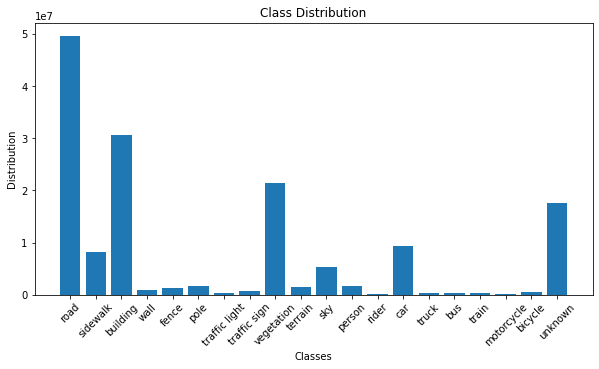

In [ ]:
import matplotlib.pyplot as plt

names = list(pixel_count_dict.keys())
values = list(pixel_count_dict.values())
plt.rcParams["figure.figsize"] = [10, 5]
plt.bar(range(len(pixel_count_dict)), values, tick_label=names)
plt.xlabel('Classes')
plt.xticks(rotation=45)
plt.ylabel('Distribution')
plt.title('Class Distribution')
plt.show()


<h3> TRAIN FUNCTION </h3>

In [ ]:
def train_function(data, model, optimizer, loss_fn, device):
    print('Entering into train function')  
    data = tqdm(data)
    for index, batch in enumerate(data): 
      #loading the data and target from the batch
        data, targets = batch
        #Convert the data according to device type
        data, targets = data.to(device), targets.to(device)
        #compute predictions by running the model
        predictions = model(X)
        #Compare the predictions and targets using the loss functions
        loss = loss_fn(predictions, targets)
        #optimizer update in backward propagation
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        #updating the tqdm loop 
        data.set_postfix(loss=loss.item())
        #return loss
    return loss.item()

TRAINING OF CITYSCAPES DATASET ON UNET

In [ ]:
global epoch
epoch = 0 # epoch is initially assigned to 0. If LOAD_MODEL is true then
          # epoch is set to the last value + 1. 
LOSS_VALS = [] # Defining a list to store loss values after every epoch

#Transform object to resize the image 
transform = transforms.Compose([
    transforms.Resize((IMG_HEIGHT, IMG_WIDTH), interpolation=Image.NEAREST),
]) 

#fetching the train set
train_set = get_cityscapes_data(split='train', mode='fine', transforms=transform, batch_size=BATCH_SIZE,)

print('Data Loaded Successfully!')

# Defining the model, optimizer and loss function
unet = UNET(in_channels=3, out_channels=19, dilated= True).to(DEVICE).train()
optimizer = optim.Adam(unet.parameters(), lr=LEARNING_RATE)
loss_function = nn.CrossEntropyLoss(ignore_index=255) 

# Loading a previous stored model from MODEL_PATH variable
if LOAD_MODEL == True:
    checkpoint = torch.load("/content/drive/MyDrive/Data/saved_model/modelparamdilated.pt")
    unet.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optim_state_dict'])
    epoch = checkpoint['epoch']+1
    LOSS_VALS = checkpoint['loss_values']
    print("Model successfully loaded!")    

#Training the model for every epoch. 
for e in range(epoch, EPOCHS):
    print(f'Epoch: {e}')
    loss_val = train_function(train_set, unet, optimizer, loss_function, DEVICE)
    LOSS_VALS.append(loss_val) 
    torch.save({
        'model_state_dict': unet.state_dict(),
        'optim_state_dict': optimizer.state_dict(),
        'epoch': e,
        'loss_values': LOSS_VALS
    }, "/content/drive/MyDrive/Data/saved_model/modelparamdilated.pt")
    print("Epoch completed and model successfully saved!")

Data Loaded Successfully!
Model successfully loaded!
Epoch: 100
Entering into train function


100%|██████████| 186/186 [05:52<00:00,  1.90s/it, loss=0.114]


Epoch completed and model successfully saved!
Epoch: 101
Entering into train function


100%|██████████| 186/186 [05:48<00:00,  1.87s/it, loss=0.115]


Epoch completed and model successfully saved!
Epoch: 102
Entering into train function


100%|██████████| 186/186 [05:49<00:00,  1.88s/it, loss=0.12]


Epoch completed and model successfully saved!
Epoch: 103
Entering into train function


100%|██████████| 186/186 [05:48<00:00,  1.88s/it, loss=0.11]


Epoch completed and model successfully saved!
Epoch: 104
Entering into train function


100%|██████████| 186/186 [05:46<00:00,  1.86s/it, loss=0.11]


Epoch completed and model successfully saved!
Epoch: 105
Entering into train function


100%|██████████| 186/186 [05:47<00:00,  1.87s/it, loss=0.107]


Epoch completed and model successfully saved!
Epoch: 106
Entering into train function


100%|██████████| 186/186 [05:47<00:00,  1.87s/it, loss=0.104]


Epoch completed and model successfully saved!
Epoch: 107
Entering into train function


100%|██████████| 186/186 [05:48<00:00,  1.88s/it, loss=0.0979]


Epoch completed and model successfully saved!
Epoch: 108
Entering into train function


100%|██████████| 186/186 [05:47<00:00,  1.87s/it, loss=0.0988]


Epoch completed and model successfully saved!
Epoch: 109
Entering into train function


100%|██████████| 186/186 [05:47<00:00,  1.87s/it, loss=0.0977]


Epoch completed and model successfully saved!
Epoch: 110
Entering into train function


100%|██████████| 186/186 [05:46<00:00,  1.86s/it, loss=0.101]


Epoch completed and model successfully saved!
Epoch: 111
Entering into train function


100%|██████████| 186/186 [05:46<00:00,  1.86s/it, loss=0.109]


Epoch completed and model successfully saved!
Epoch: 112
Entering into train function


100%|██████████| 186/186 [05:47<00:00,  1.87s/it, loss=0.114]


Epoch completed and model successfully saved!
Epoch: 113
Entering into train function


100%|██████████| 186/186 [05:47<00:00,  1.87s/it, loss=0.105]


Epoch completed and model successfully saved!
Epoch: 114
Entering into train function


100%|██████████| 186/186 [05:46<00:00,  1.87s/it, loss=0.105]


Epoch completed and model successfully saved!
Epoch: 115
Entering into train function


100%|██████████| 186/186 [05:46<00:00,  1.87s/it, loss=0.0989]


Epoch completed and model successfully saved!
Epoch: 116
Entering into train function


100%|██████████| 186/186 [05:46<00:00,  1.86s/it, loss=0.0966]


Epoch completed and model successfully saved!
Epoch: 117
Entering into train function


100%|██████████| 186/186 [05:46<00:00,  1.86s/it, loss=0.0965]


Epoch completed and model successfully saved!
Epoch: 118
Entering into train function


100%|██████████| 186/186 [05:47<00:00,  1.87s/it, loss=0.101]


Epoch completed and model successfully saved!
Epoch: 119
Entering into train function


100%|██████████| 186/186 [05:46<00:00,  1.86s/it, loss=0.0986]


Epoch completed and model successfully saved!


In [ ]:
#loading of the save model for further computation
model = UNET(in_channels=3, out_channels=19,dilated=True).to(DEVICE)
optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)
model.load_state_dict(torch.load("/content/drive/MyDrive/Data/saved_model/modelparamdilated.pt")['model_state_dict'])
checkpoint = torch.load("/content/drive/MyDrive/Data/saved_model/modelparamdilated.pt")
optimizer.load_state_dict(checkpoint['optim_state_dict'])
epoch = checkpoint['epoch']+1
LOSS_VALS = checkpoint['loss_values']
print("Model successfully loaded!")    

Model successfully loaded!


FUNCTION TO SAVE AND EVALUATE 

In [ ]:
IMAGE_HEIGHT = 300
IMAGE_WIDTH = 600

def save_predictions_and_evaluate(path):
   """
  This funtion is used to save the model predictions and evaluate the prediction using the metric and loss plot
  
    Parameters
    ----------
   path: model path      

    Returns
    -------
    N.A
  """    
  
    #define the transform
    T = transforms.Compose([
        transforms.Resize((IMAGE_HEIGHT, IMAGE_WIDTH), interpolation=Image.NEAREST)
    ])

    #fetch the validation set data loader
    val_set = get_cityscapes_data(        
        split='val',
        mode='fine',       
        transforms=T,
        shuffle=True,
        eval=True
    )
 
    print('Validation data has been loaded!')
 
    #load the model from checkpoint
    net = UNET(in_channels=3, out_channels=19,dilated=True).to(DEVICE)
    checkpoint = torch.load(path)
    net.load_state_dict(checkpoint['model_state_dict'])
    net.eval()
    print(f'{path} has been loaded and initialized')
    
    with torch.no_grad():
        for idx, batch in enumerate(tqdm(val_set)):

            input_image, target_label, file_name = batch # here 'file_name' is the name of the file stored in the root directory
            input_image, target_label = input_image.to(DEVICE), target_label.to(DEVICE)
            predictions = model(input_image) 
            
            #Applying softmax and then argmax to get the prediction of highest probabilty
            predictions = torch.nn.functional.softmax(predictions, dim=1)
            pred_labels = torch.argmax(predictions, dim=1) 
            pred_labels = pred_labels.float()

            # Remapping the labels using helper function from Cityscapes lib
            pred_labels = pred_labels.to('cpu')
            pred_labels.apply_(lambda x: t2l[x].id)
            pred_labels = pred_labels.to(DEVICE)   

            # Resizing predicted images too original size
            pred_labels = transforms.Resize((1024, 2048))(pred_labels)             

            # Configure filename & location to save predictions as images
            file_name = str(file_name)
            pos = file_name.rfind('/', 0, len(file_name))
            name = file_name[pos+1:-18]              
            location = "/content/drive/MyDrive/Data/saved_images"

            #convert the prediction tensor to PIL image and save it in png format
            pred_labels = transforms.ToPILImage()(pred_labels.byte())
            filename = f"{location}/{name}.png"
            pred_labels.save(filename)          

In [ ]:
save_predictions_and_evaluate("/content/drive/MyDrive/Data/saved_model/modelparamdilated.pt")

/usr/local/lib/python3.7/dist-packages/torchvision/transforms/transforms.py:333: UserWarning: Argument 'interpolation' of type int is deprecated since 0.13 and will be removed in 0.15. Please use InterpolationMode enum.
  "Argument 'interpolation' of type int is deprecated since 0.13 and will be removed in 0.15. "


Validation data has been loaded!
/content/drive/MyDrive/Data/saved_model/modelparamdilated.pt has been loaded and initialized


100%|██████████| 500/500 [07:53<00:00,  1.06it/s]


VISUALIZE PREDICTION MASKS

In [ ]:
import matplotlib.image as mimg
def visualize_prediction_masks(folder="/content/drive/MyDrive/Data/saved_images/", device="cuda"):

  """
  This funtion is used to visualize example predictions in the image format
  
    Parameters
    ----------
   folder: path to where the image is saved
   device: cuda or cpu       

    Returns
    -------
    N.A
  """    
    T = transforms.Compose([
        transforms.Resize((IMAGE_HEIGHT, IMAGE_WIDTH), interpolation=Image.NEAREST)
    ])

    val_set = get_cityscapes_data(        
        split='val',
        mode='fine',       
        transforms=T,
        shuffle=True,
        eval=True
    )
        
    fig,ax=plt.subplots(ncols=3,nrows=5,figsize=(100,100))    
    for idx, batch in enumerate(val_set):
        #load the batched data
        x,y,s =batch
        x = x.to(device=device)    
        y = y.to(device=device)
        #image name to string
        s = str(s)
        #retrieve the image name
        pos = s.rfind('/', 0, len(s))
        name = s[pos+1:-18]
        print(s)
        #run for 5 exampple images
        if idx<5 :
          ax[idx,0].imshow(x.to('cpu').squeeze().permute(1, 2, 0))
          ax[idx,2].imshow(y.to('cpu').squeeze())
          im = mimg.imread(f"{folder}{name}.png")
          ax[idx,1].imshow(im,cmap='gray')
        else:
          break

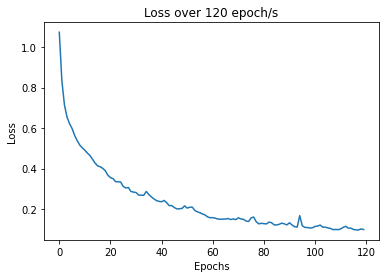

In [ ]:
#Plot the loss values from checkpoint saved
checkpoint = torch.load("/content/drive/MyDrive/Data/saved_model/modelparamdilated.pt")
losses = checkpoint['loss_values']
epoch = checkpoint['epoch']
epoch_list = list(range(epoch+1))
plt.plot(epoch_list, losses)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title(f"Loss over {epoch+1} epoch/s")
plt.show()

/usr/local/lib/python3.7/dist-packages/torchvision/transforms/transforms.py:333: UserWarning: Argument 'interpolation' of type int is deprecated since 0.13 and will be removed in 0.15. Please use InterpolationMode enum.
  "Argument 'interpolation' of type int is deprecated since 0.13 and will be removed in 0.15. "


['/munster/munster_000078_000019_leftImg8bit.png']
['/munster/munster_000058_000019_leftImg8bit.png']
['/frankfurt/frankfurt_000001_075984_leftImg8bit.png']
['/munster/munster_000037_000019_leftImg8bit.png']
['/munster/munster_000038_000019_leftImg8bit.png']
['/lindau/lindau_000055_000019_leftImg8bit.png']


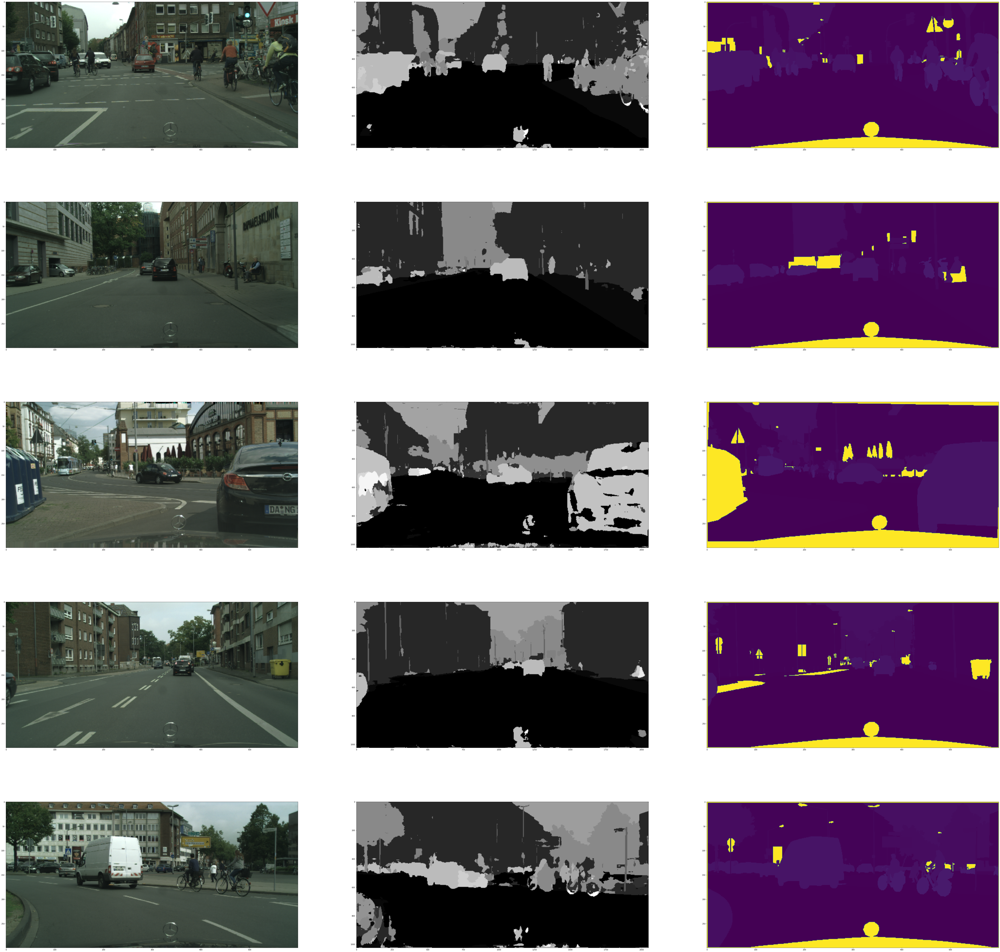

In [ ]:
visualize_prediction_masks()

<h3>OVERLAY PREDICTION MASK ON ORIGINAL IMAGE</h3>

In [ ]:
IMAGE_HEIGHT = 300
IMAGE_WIDTH = 600
def prediction_masks_overlay(folder="/content/drive/MyDrive/Data/saved_images/", device="cuda",n=5):
    
  """
  This funtion is used to return a sample of 5 predictions to overlay the mask of the road on the original image for those samples
  
    Parameters
    ----------
   folder: path to where the image is saved
   device: cuda or cpu       

    Returns
    -------
    og_image: orginial image list
    predictions_image : prediction_image_list
    y_image: original label of the image
  """  
    T = transforms.Compose([
        transforms.Resize((IMAGE_HEIGHT, IMAGE_WIDTH), interpolation=Image.NEAREST)
    ])

    val_set = get_cityscapes_data(        
        split='val',
        mode='fine',       
        transforms=T,
        shuffle=True,
        eval=True
    )

    og_image = []
    y_image = []
    predictions_image=[]
        
    #fig,ax=plt.subplots(ncols=3,nrows=5,figsize=(100,100))    
    for idx, batch in enumerate(val_set):       
        input_image, target_label, file_name = batch # here 'file_name' is the name of the file stored in the root directory
        input_image, target_label = input_image.to(DEVICE), target_label.to(DEVICE)
        predictions = model(input_image) 
        
        #Applying softmax and then argmax to get the prediction of highest probabilty
        predictions = torch.nn.functional.softmax(predictions, dim=1)
        pred_labels = torch.argmax(predictions, dim=1) 
        pred_labels = pred_labels.float()

        # Remapping the labels
        pred_labels = pred_labels.to('cpu')
        pred_labels.apply_(lambda x: t2l[x].id)
        pred_labels = pred_labels.to(DEVICE)   
  

        og_image.append(x)
        y_image.append(y)
        predictions_image.append(pred_labels)
     
        if idx<n :
          continue
        else:
          break    
    return og_image,y_image,predictions_image       


In [ ]:
og_image,y_image,predictions_image = prediction_masks_overlay()

/usr/local/lib/python3.7/dist-packages/torchvision/transforms/transforms.py:333: UserWarning: Argument 'interpolation' of type int is deprecated since 0.13 and will be removed in 0.15. Please use InterpolationMode enum.
  "Argument 'interpolation' of type int is deprecated since 0.13 and will be removed in 0.15. "


In [ ]:
#define subplot to visualise the overlay mask
fig, axs = plt.subplots(nrows=6, ncols=2,figsize=(100,200))
#iterate through the list of original image for overlaying
for i in range(len(og_image)):
  #predicted image
  predicted_image = predictions_image[i]
  #original image
  original_image=og_image[i].squeeze(dim=0)
  #the class value for road is 7, therefore setting all other masks to 1
  predicted_image[predicted_image!=7]= 255
  #convert the values to PIL images in the format png and save in local
  predicted_image = transforms.ToPILImage()(predicted_image.byte())
  original_image = transforms.ToPILImage()(original_image).save(f"/content/drive/MyDrive/Data/testimages/original_image{i}.png", format="png")
  predicted_image.save(f"/content/drive/MyDrive/Data/testimages/predicted_image{i}.png")
  #fethching the saved image from the local and coverting to same format for visualisation
  pred_mask = Image.open(f"/content/drive/MyDrive/Data/testimages/predicted_image{i}.png").convert('RGBA')
  org_img = Image.open(f"/content/drive/MyDrive/Data/testimages/original_image{i}.png").convert('RGBA')
  #Overlaying the road mask on the original image by setting the transparancy factor alpha=0.5
  axs[i,1].imshow(org_img)
  axs[i,1].imshow(pred_mask, cmap='jet', alpha=0.5)
  axs[i,0].imshow(org_img)